# Image Enhancement 

Image enhancement is a fundamental task in Digital Image Processing (DIP) used to improve the visual appearance of an image. It involves manipulating an image to make it more suitable for a specific application or to extract information from it. 
The techniques for image processing belong to two domains :- i.e. Spatial domain and Frequency Domain.
This notebook contains the implementation of Spatial domain filters 
There are several techniques used in image enhancement within DIP in spatial domain , in thisnnotebook we discuss the follwing methods:
- Colour Slicing
- Gamma Correction(Power Law Transformation)
- Dynamic Range Compression using log function
- Image Negative 
- Gray Level Slicing 
- Contrast Stretching 
- Tone Correction 
- Histogram Methods 

We are going to compare the images for different parameters for the same methods initially and move on to comparing images for different methods later and also check combination of different methods.

### Importing the required libraries

In [2]:

import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import cv2



## Making the error metric calculator:

In [ ]:

# # Start MATLAB engine
# eng = matlab.engine.start_matlab()

# # Load original and enhanced images using MATLAB functions
# original_image_matlab = eng.imread('path_to_original_image.jpg')
# enhanced_image_matlab = eng.imread('path_to_enhanced_image.jpg')

# # Convert MATLAB arrays to Python lists or numpy arrays if necessary
# # Perform necessary data type conversions

# # Calculate VIF using the MATLAB function
# vif_value = eng.VIF_MATLAB(original_image_matlab, enhanced_image_matlab)

# # Close MATLAB engine
# eng.quit()

# print(f"VIF: {vif_value}")


### Reading the Images

In [3]:
photos = []
elephant = cv2.imread('3.jpg')
bean_bag_guy = cv2.imread('7.jpg')
some_japanese_shit = cv2.imread('8.jpg')
bear = cv2.imread('be.jpg')
camera  = cv2.imread('gamma_transformed0.1.jpg')
low_light_fruits = cv2.imread('Low-light-images-under-three-illumination-conditions-figure-best-viewed-in-color.png')
fefda = cv2.imread('tmp648_thumb_thumb.jpg')
coffee_beans = cv2.imread('download (9).jpg')

photos.extend([elephant,bean_bag_guy,some_japanese_shit,bear,camera,low_light_fruits,fefda,coffee_beans])


# Original Images 

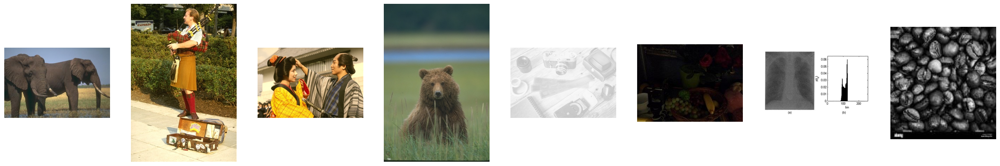

In [13]:
plt.figure(figsize=(30,20))

for i,photo in enumerate(photos):
    plt.subplot(1,len(photos),i+1)
    plt.imshow(cv2.cvtColor(photo,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    

In [3]:
def get_obj(data,lower,upper):
# Convert BGR to HSV
    hsv = cv2.cvtColor(data,cv2.COLOR_BGR2HSV)
        # define range of blue color in HSV
    # cv2.imshow('hehe',hsv)
    # lower_blue = np.array([0,0,0])
    # upper_blue = np.array([255,110,100])
        # Threshold the HSV image to get only blue colors
    mask = cv2.inRange(hsv, lower, upper)
        # Bitwise-AND mask and original image
    res = cv2.bitwise_and(data,data, mask= mask)
    cv2.imshow('frame',data)
    cv2.imshow('mask',mask)
    cv2.imshow('res',res)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


## Colour Slicing for highlighting colour range
Most of the colours require a good upper and lower ranges to get the desired results .

In [4]:
def highlight_obj_ele(image,lower,upper):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define range of colors to highlight (e.g., blue)
#     lower_blue = np.array([90, 50, 50])  # Lower range for blue
#     upper_blue = np.array([130, 255, 255])  # Upper range for blue

    # Create a mask for the specified color range
    mask = cv2.inRange(hsv, lower, upper)

    # Create a desaturated version of the image
    image_grey = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    desaturated_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    desaturated_image = cv2.cvtColor(desaturated_image, cv2.COLOR_GRAY2BGR)

    # Apply the mask to the desaturated image
    desaturated_image[np.where(mask == 0)] = image[np.where(mask==0)]
#     desaturated_image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    
    # Show the original image and the desaturated non-highlighted areas
#     cv2.imshow('Original Image', image)
#     cv2.imshow('Desaturated Non-Highlighted Areas', desaturated_image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')

    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(desaturated_image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')

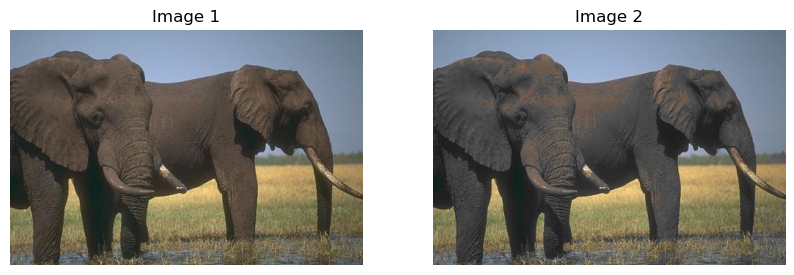

In [16]:
highlight_obj_ele(elephant,np.array([0,0,0]),np.array([255,110,100])) #elephant

In [123]:
get_obj(bear,np.array([0,0,0]),np.array([255,80,100]))

In [5]:
def highlight_obj(image,lower,upper):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    cv2.imshow('Original Image', image)
    

    # Define range of colors to highlight (e.g., blue)
#     lower_blue = np.array([90, 50, 50])  # Lower range for blue
#     upper_blue = np.array([130, 255, 255])  # Upper range for blue

    # Create a mask for the specified color range
    mask = cv2.inRange(hsv, lower, upper)

    # Create a desaturated verson of the image
    desaturated_image = hsv

#     desaturated_image = cv2.cvtColor(desaturated_image, cv2.COLOR_GRAY2BGR)
    
    # Apply the mask to the desaturated image
    desaturated_image[np.where(mask == 0)] = hsv[np.where(mask == 0)]+[0,0,40]
#     desaturated_image = cv2.cvtColor(desaturated_image, cv2.COLOR_HSV2BGR)
    
    desaturated_image = cv2.cvtColor(desaturated_image,cv2.COLOR_HSV2BGR)
    # Show the original image and the desaturated non-highlighted areas
#     cv2.imshow('Desaturated Non-Highlighted Areas', desaturated_image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')

    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(desaturated_image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')

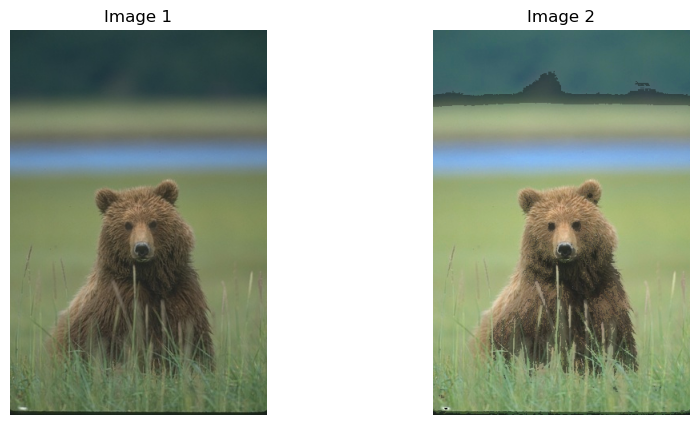

In [14]:
highlight_obj(bear,np.array([10,0,0]),np.array([100,80,100]))

In [4]:
cv2.imshow('wadad',bear)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Gamma Correction in Images

In [6]:
def gamma_solve(image,gammas,c):
    cv2.imshow('Desaturated Non-Highlighted Areas', image)
    plt.figure(figsize=(40,20))

    plt.subplot(1, len(gammas)+1, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')
    i=2
    
    for gamma in gammas :
        im = np.array(c*255*(image/255)**gamma, dtype = 'uint8')


        plt.subplot(1, len(gammas)+1,i )  # 1 row, 2 columns, second subplot
        plt.imshow(cv2.cvtColor(im,cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title('Image 2')
        i = i+1
    
    

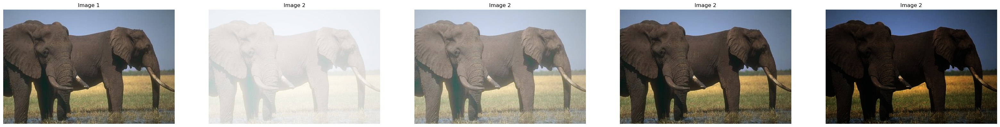

In [40]:
gamma_solve(elephant,[0.1,0.5,1.2,2.2],1)

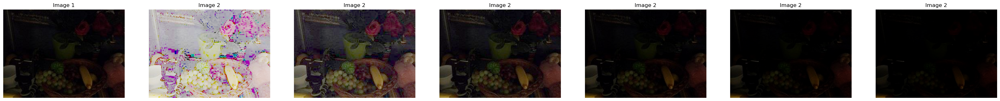

In [41]:
gamma_solve(low_light_fruits,[0.1,0.5,0.8,1.2,1.5,1.8],1)

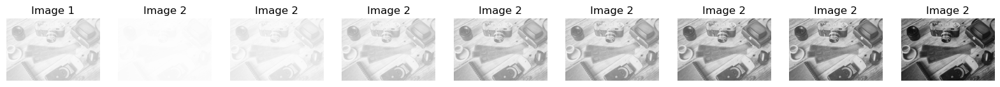

In [34]:
gamma_solve(camera,[0.1,0.5,1.2,2.2,2.5,4.0,5.0,10],1)

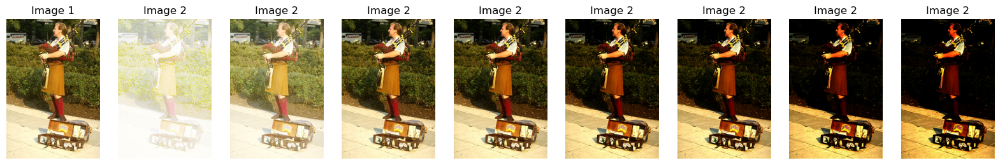

In [37]:
gamma_solve(bean_bag_guy,[0.1,0.5,1.2,1.5,2.2,2.5,4.0,5.0],1)

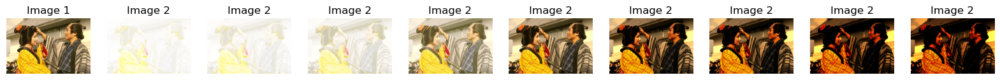

In [38]:
gamma_solve(some_japanese_shit,[0.03,0.05,0.1,0.5,1.2,2.2,2.5,4.0,5.0],1)

In [51]:
cv2.imshow('asdad',bean_bag_guy)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [8]:
ll2  = cv2.imread('download (5).jpg')

In [39]:
fefda = cv2.imread('tmp648_thumb_thumb.jpg')

In [42]:
    cv2.namedWindow('asdad', cv2.WINDOW_NORMAL) 
    cv2.resizeWindow('asdad' , 400,300)
    cv2.imshow('asdad',fefda)
    
    cv2.waitKey(0)
    cv2.destroyAllWindows()

## Contrast stretching for Black and White images

In [7]:
def contrast_stretching(image,s1,r1,s2,r2):
    image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')
    
    for n in range(0,image.shape[0]):
        for k in range(0,image.shape[1]):
            if image[n][k] <r1 :
                image[n][k] = image[n][k]*s1/r1
            elif(image[n][k]<r2 and image[n][k]>r1):
                image[n][k] = image[n][k]*(s2-s1)/(r2-r1)
            else:
                image[n][k]= image[n][k]*(255-s2)/(255-s2)

#     image = cv2.cvtColor(image,cv2.COLOR_GRAY2BGR)
    
#     cv2.namedWindow('asdad', cv2.WINDOW_NORMAL) 
#     cv2.resizeWindow('asdad' , 400,300)
#     cv2.imshow('asdad',image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()


    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')


In [43]:
contrast_stretching(ll2,80,40,200,120)

NameError: name 'll2' is not defined

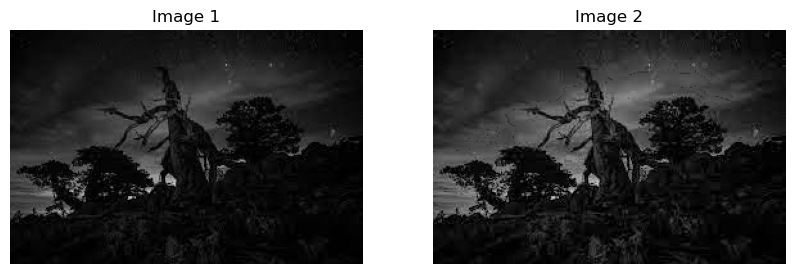

In [50]:
contrast_stretching(ll2,80,50,150,100)

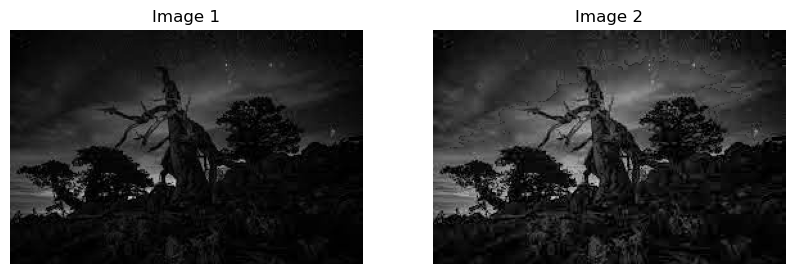

In [51]:
contrast_stretching(ll2,80,40,200,120)

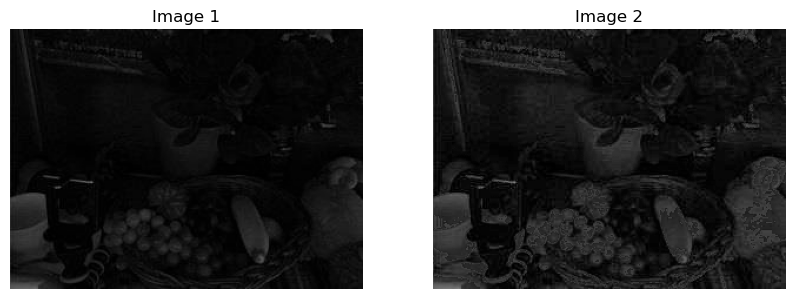

In [46]:
contrast_stretching(low_light_fruits,70,30,200,140)

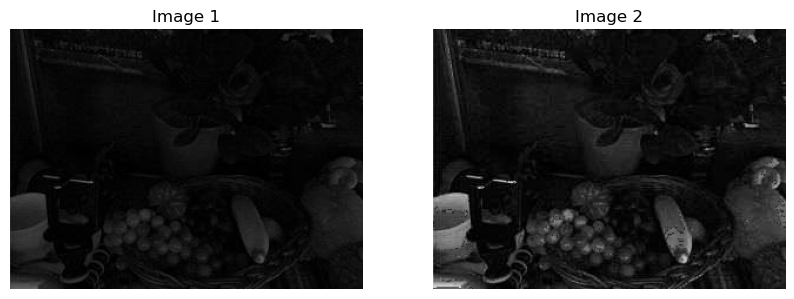

In [47]:
contrast_stretching(low_light_fruits,80,40,200,90)

In [54]:
# contrast_stretching(ll2,80,40,200,80)

In [52]:
# contrast_stretching(fefda,10,20,100,80)

In [54]:
# contrast_stretching(ll2,80,40,200,120)

In [118]:
img = cv2.cvtColor(low_light,cv2.COLOR_BGR2GRAY)

In [90]:
img[img<2]

array([0, 0, 1, ..., 0, 0, 1], dtype=uint8)

In [66]:
gamma_solve(fefda,[0.02,0.05,0.09, 1.2,1.5,2.0,2.5,3,5],1)

## Dynamic range compression


In [9]:
def drc(image):
    image_float32 = image.astype(np.float32) / 255.0

    # Apply logarithmic transformation (logarithmic compression) to the image
    compressed_image = np.uint8(255 *np.log(1 + image_float32))

    # Display original and compressed images
#     cv2.namedWindow('ok',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('ok',400,300)
#     cv2.namedWindow('ok1',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('ok1',400,300)
#     cv2.imshow('ok', image)
#     cv2.imshow('ok1', compressed_image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')

    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(compressed_image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')
    
#     return cv2.cvtColor(compressed_image,cv2.COLOR_BGR2RGB)


array([[[163, 153, 137],
        [163, 153, 137],
        [163, 153, 136],
        ...,
        [ 92,  81,  51],
        [ 93,  83,  53],
        [ 70,  59,  30]],

       [[163, 152, 137],
        [163, 153, 137],
        [163, 153, 136],
        ...,
        [ 92,  81,  51],
        [ 94,  83,  53],
        [ 92,  82,  56]],

       [[163, 153, 136],
        [163, 153, 136],
        [163, 153, 136],
        ...,
        [ 92,  82,  52],
        [ 93,  82,  53],
        [ 94,  85,  58]],

       ...,

       [[ 47,  40,  22],
        [ 47,  42,  22],
        [ 48,  42,  25],
        ...,
        [101,  92,  72],
        [ 27,  18,   0],
        [ 23,  18,   2]],

       [[ 46,  39,  21],
        [ 48,  43,  23],
        [ 47,  41,  24],
        ...,
        [ 37,  26,   1],
        [ 25,  18,   0],
        [ 24,  19,   5]],

       [[ 47,  42,  22],
        [ 44,  40,  21],
        [ 46,  42,  22],
        ...,
        [ 32,  22,   1],
        [ 27,  21,   2],
        [ 22,  20,   5]]

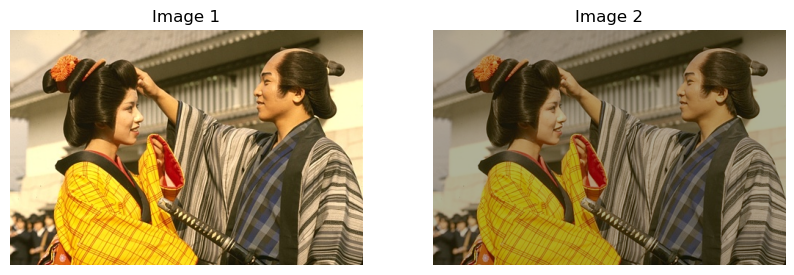

In [70]:
drc(some_japanese_shit)

In [58]:
# img = cv2.imread("download (8).jpg")

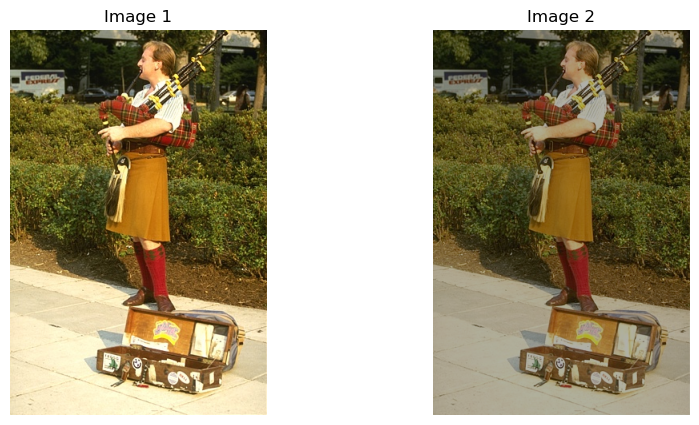

In [61]:
drc()

In [32]:
im = np.array(255*(camera/255)**3, dtype = 'uint8')

drc(im)

## Image Negative

In [10]:
def neg_img(image):
    neg_image  = 255- image
#     cv2.namedWindow('original',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('original',400,300)
#     cv2.namedWindow('negative',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('negative',400,300)
#     cv2.imshow('original', image)
#     cv2.imshow('negative', neg_image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')

    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(neg_image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')
    
#     return cv2.cvtColor(neg_image,cv2.COLOR_BGR2RGB)

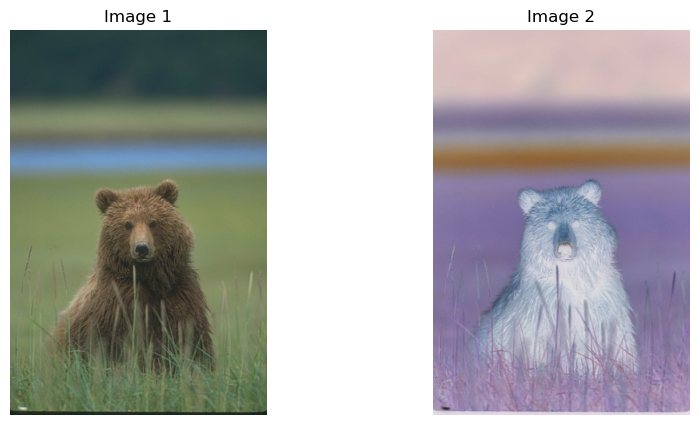

In [64]:
neg_img(bear)

array([[[ 92,  91,  93],
        [ 83,  82,  85],
        [ 84,  83,  84],
        ...,
        [ 93,  82,  85],
        [ 93,  81,  85],
        [ 93,  81,  85]],

       [[ 92,  91,  93],
        [ 83,  82,  85],
        [ 83,  82,  84],
        ...,
        [ 92,  81,  85],
        [ 93,  81,  85],
        [ 93,  81,  85]],

       [[ 92,  91,  94],
        [ 83,  82,  85],
        [ 83,  82,  84],
        ...,
        [ 92,  81,  85],
        [ 92,  81,  85],
        [ 92,  81,  85]],

       ...,

       [[155, 137,  95],
        [155, 137,  94],
        [156, 138,  95],
        ...,
        [100,  85,  84],
        [100,  85,  83],
        [100,  85,  83]],

       [[156, 138,  95],
        [156, 138,  95],
        [157, 139,  96],
        ...,
        [100,  85,  84],
        [100,  85,  83],
        [100,  85,  83]],

       [[159, 140,  97],
        [159, 141,  97],
        [161, 143,  97],
        ...,
        [100,  85,  84],
        [100,  85,  83],
        [100,  85,  83]]

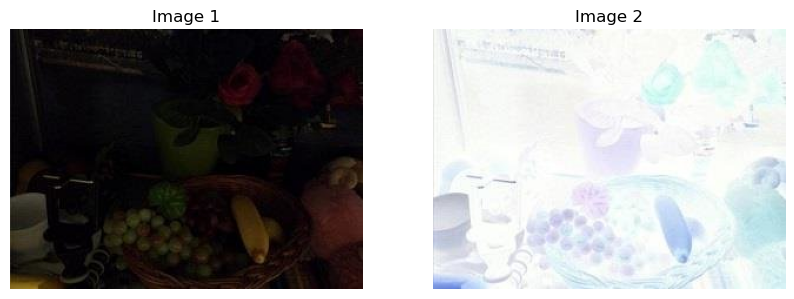

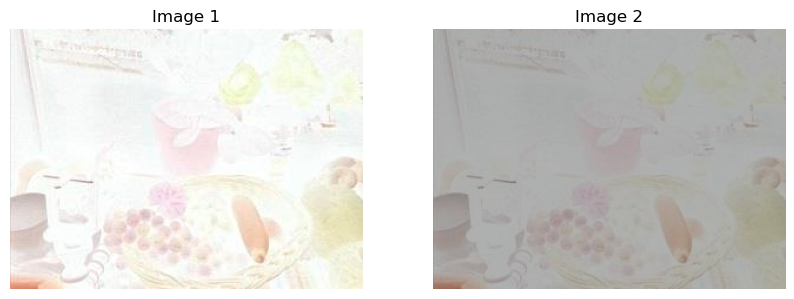

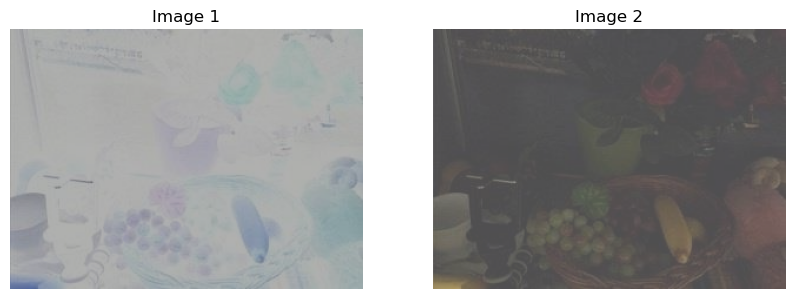

In [71]:
neg_img(drc(neg_img(low_light_fruits)))

## Gray Level Slicing
We will be using two methods 
- Decreasing all other intensity levels to a constant except the range we need 
- Increasing intensity in our range to a particular constant while keeping rest of the range original 

In [11]:
def gray_slice_no_bg(image,lower_limit ,upper_limit,lower_const,upper_const):
    gray_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    for n in range(0,gray_image.shape[0]):
        for k in range(0,gray_image.shape[1]):
            if (gray_image[n][k] <lower_limit or gray_image[n][k] >upper_limit) :
                gray_image[n][k] = lower_const
            else :
                gray_image[n][k] = upper_const
    
#     gray_image  = cv2.cvtColor(gray_image,cv2.COLOR_GRAY2BGR)
    
#     cv2.namedWindow('original',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('original',400,300)
#     cv2.namedWindow('negative',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('negative',400,300)
#     cv2.imshow('original', image)
#     cv2.imshow('negative', gray_image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')

    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(gray_image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')


In [79]:
def gray_slice_bg(image,lower_limit ,upper_limit,upper_const):
    gray_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    for n in range(0,gray_image.shape[0]):
        for k in range(0,gray_image.shape[1]):
            if (gray_image[n][k] <lower_limit or gray_image[n][k] >upper_limit) :
                continue
            else :
                gray_image[n][k] = upper_const
    
#     gray_image  = cv2.cvtColor(gray_image,cv2.COLOR_GRAY2BGR)
    
#     cv2.namedWindow('original',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('original',400,300)
#     cv2.namedWindow('negative',cv2.WINDOW_NORMAL)
#     cv2.resizeWindow('negative',400,300)
#     cv2.imshow('original', image)
#     cv2.imshow('negative', gray_image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 1')

    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    plt.imshow(cv2.cvtColor(gray_image,cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Image 2')

In [83]:
# fefda

180
190
200
210
220
230
240
250


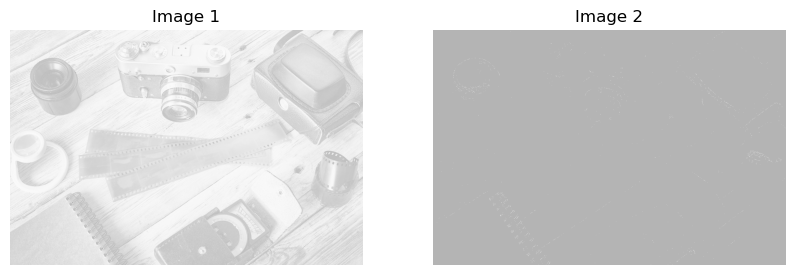

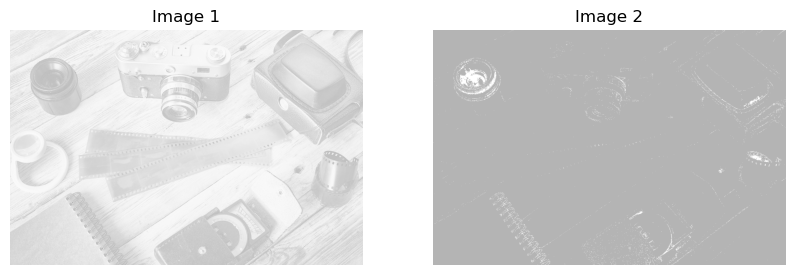

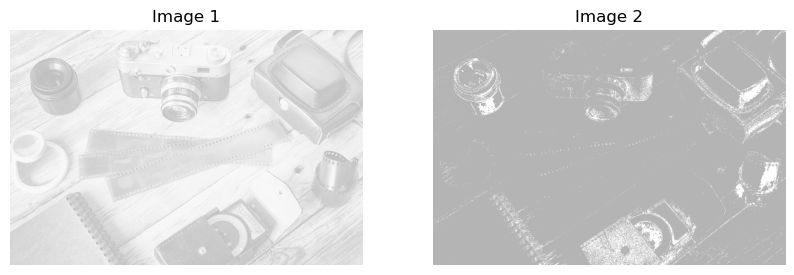

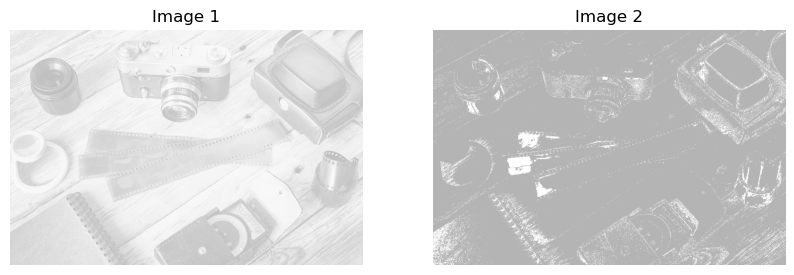

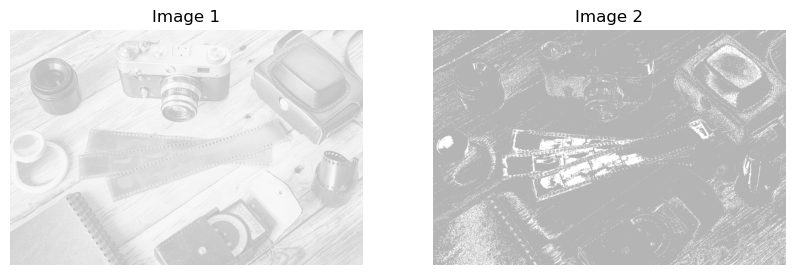

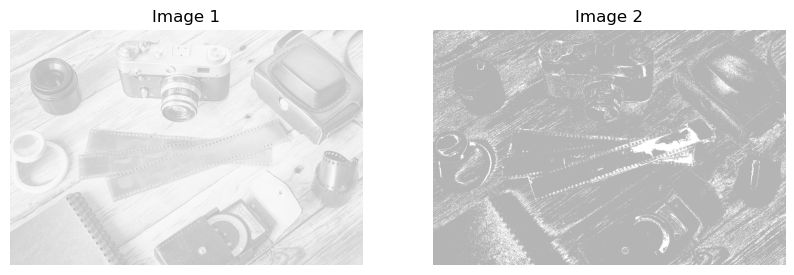

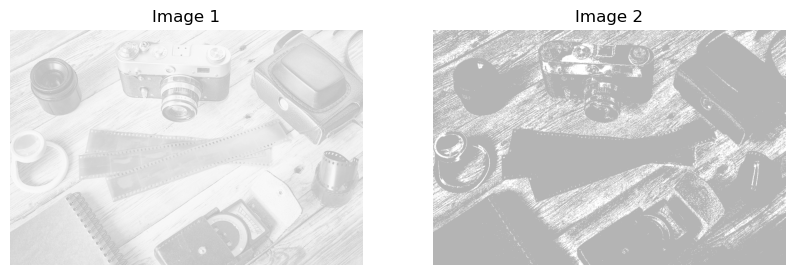

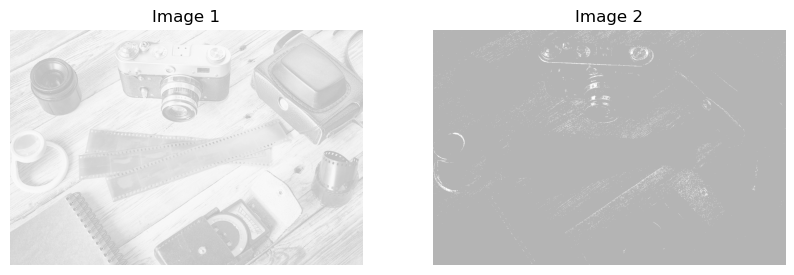

In [85]:
for i in range(180,255,10):
    gray_slice_no_bg(camera,i,i+5,180,255)
    print(i)

C:\Users\shish\AppData\Local\Temp\ipykernel_1644\3492751960.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 5))


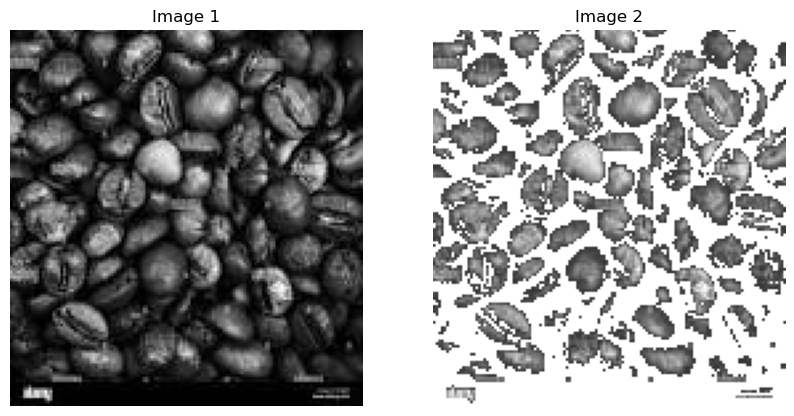

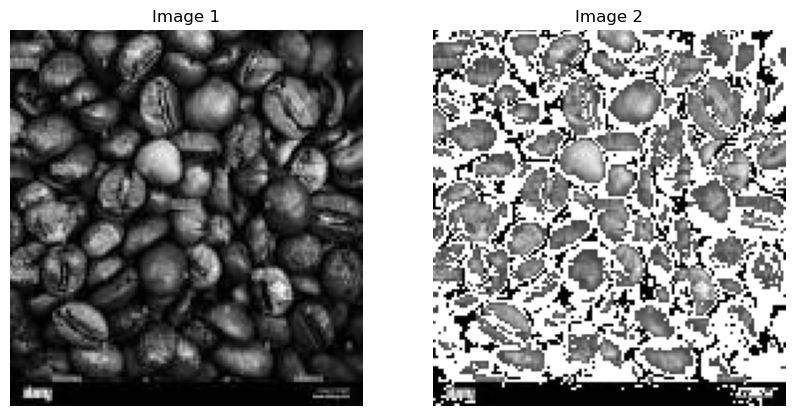

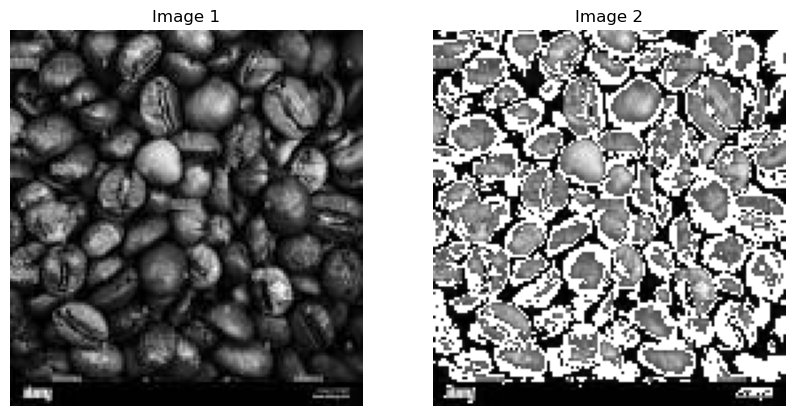

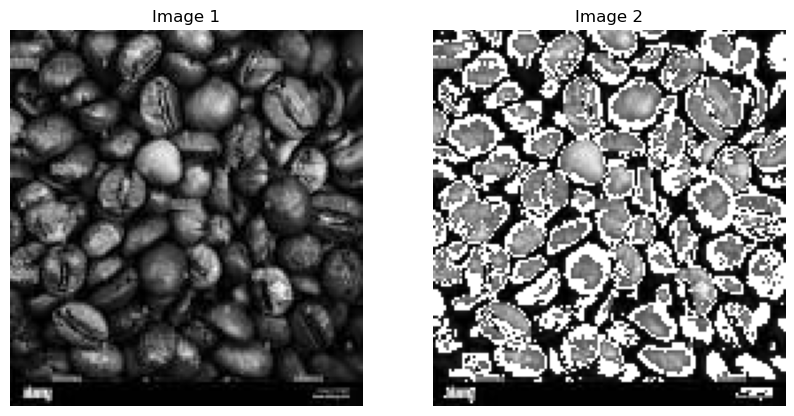

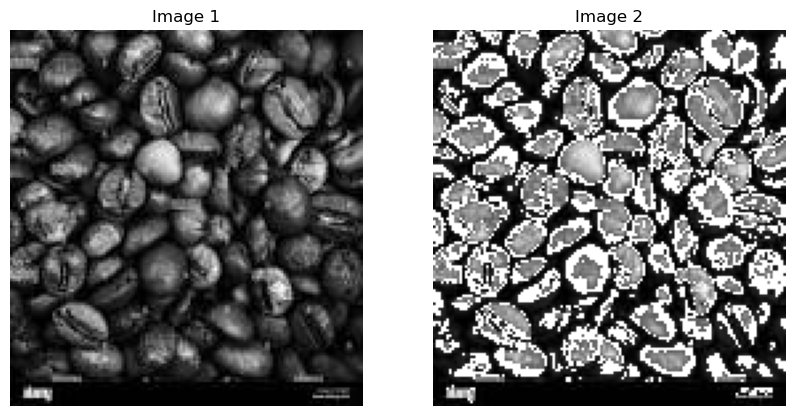

...

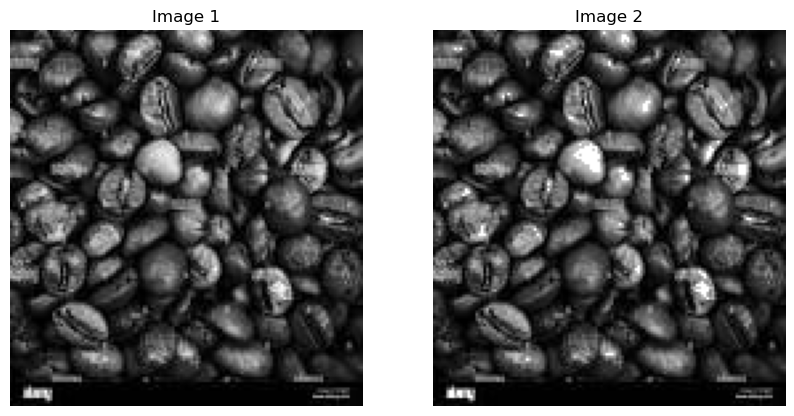

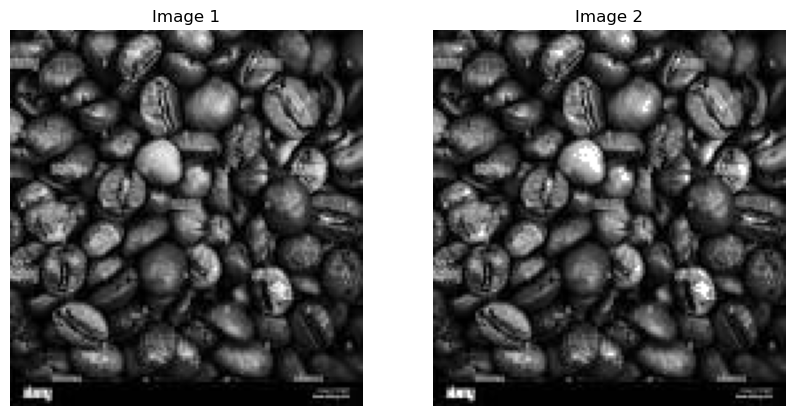

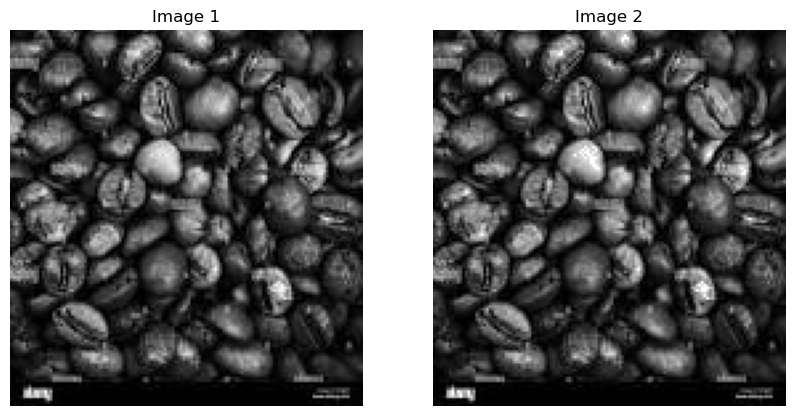

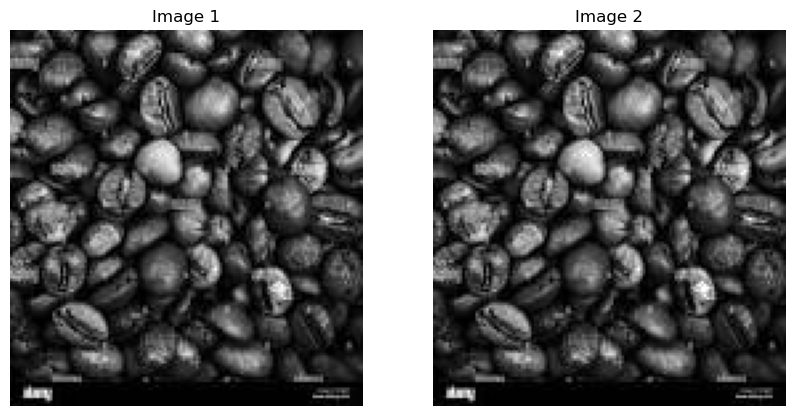

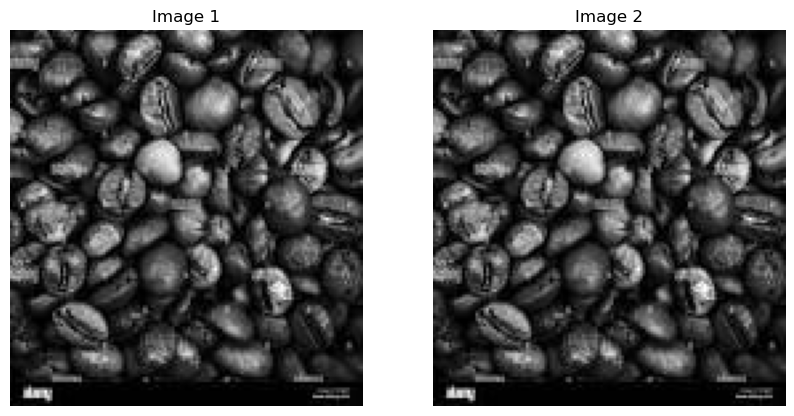

In [82]:
for i in range(0,250,10):
    gray_slice_bg(coffee_beans,i,i+50,255)
#     print(i)

In [78]:
for i in range(0,250,10):
    gray_slice_bg(fefda,i,i+50)
    print(i)

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 260 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


160


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 270 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


170


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 280 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


180


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 290 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


190


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 300 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


200


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 310 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


210


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 320 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


220


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 330 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


230


C:\Users\shish\AppData\Local\Temp\ipykernel_10400\3236046671.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 340 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  gray_image[n][k] = upper_const


240


## Tone Correction 
Tone correction for dark and light images can be done using the gamma method that we have already discussed and histogram methods can be used for all types of images . In this section we discuss solely the flat images and implement a function for tone correction

## Histogram Methods 
We discuss different methods related to histogram like histogram equalization ,adaptive histogram equalization and compare their reuslts.

In [31]:
def plot_hist(image):
    color = ('b','g','r')
    for i,col in enumerate(color):
        hist = np.bincount(image[i].ravel(),minlength=256)
#         histogram = np.histogram(gray_image.ravel(), bins=256, range=[0,256])
        plt.plot(hist,color = col)
        plt.xlim([0,256])
        plt.title('Original Histogram')
        plt.legend(['b','g','r'])
    plt.show()

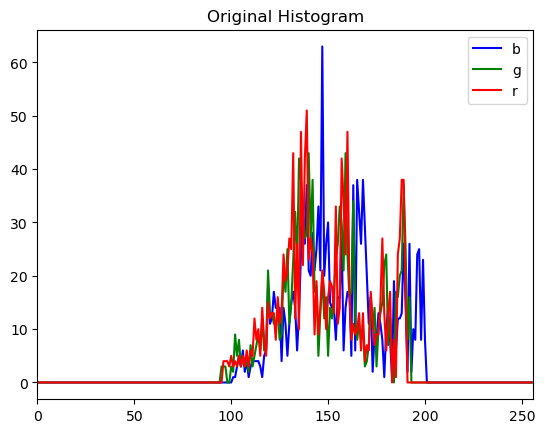

In [32]:
plot_hist(elephant)

In [65]:
def hist_eq_grey(image):
    grey = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    
    hist = np.bincount(grey.ravel(),minlength=256)
    cdf = hist.cumsum()
    cdf_normalised = cdf *hist.max()/cdf.max()
    plt.plot(cdf_normalised, color = 'b')
    plt.hist(grey.ravel(),256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.show()
    
#     print(cdf)
#     print(cdf_normalised)
    
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    
    img2 = cdf[grey]
    
#     plt.imshow(cv2.cvtColor(img2))
    plt.imshow(img2,cmap='rgb')
    
    plt.show()
    

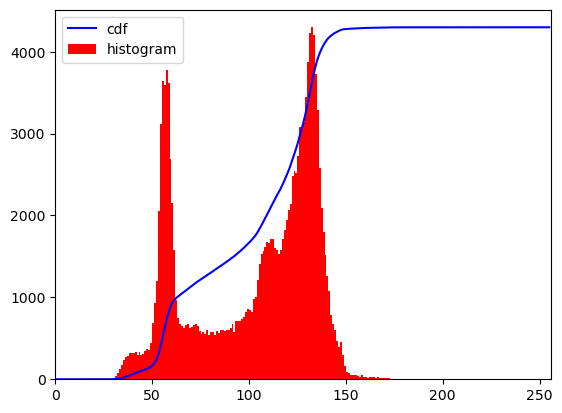

ValueError: 'rgb' is not a valid value for cmap; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

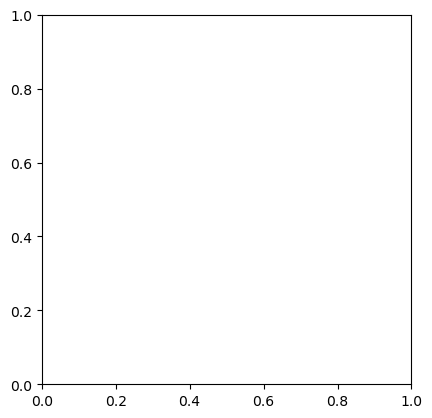

In [66]:
hist_eq_grey(bear)

In [ ]:

Performing histogram equalization on colored images using NumPy requires channel-wise processing. Here's an example of how you might apply histogram equalization to each channel (R, G, B) of a colored image:

python
Copy code
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the colored image using OpenCV
image = cv2.imread('colored_image.jpg')

# Split the image into its color channels (BGR)
b, g, r = cv2.split(image)

# Equalize histogram for each channel separately
b_eq = cv2.equalizeHist(b)
g_eq = cv2.equalizeHist(g)
r_eq = cv2.equalizeHist(r)

# Merge the equalized channels back into an RGB image
equalized_image = cv2.merge((b_eq, g_eq, r_eq))

# Display the original and equalized images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB))
plt.title('Histogram Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()